In [ ]:
# importing libraries
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense
from keras import backend as K
import tensorflow as tf
from matplotlib import pyplot
import pandas as pd
from numpy import expand_dims
from google.colab import drive
import pathlib
from skimage import io
from tensorflow.keras import datasets, layers, models
import os
import cv2
import numpy as np
from  matplotlib import pyplot as plt
from sklearn.metrics import classification_report

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls drive/MyDrive/'NEURAL NETWORK PROJECT'/Datasets

test  train


In [ ]:
dataset = "drive/MyDrive/NEURAL NETWORK PROJECT/Datasets/"

train = dataset + "train"
test = dataset + "test"

In [ ]:
IMG_HEIGHT, IMG_WIDTH = 227, 227

def create_dataset(img_folder):
   
    img_data_array=[]
    class_name=[]
   
    for dir1 in os.listdir(img_folder):
        for file in os.listdir(os.path.join(img_folder, dir1)):
       
            image_path= os.path.join(img_folder, dir1,  file)
            image= cv2.imread( image_path, cv2.COLOR_BGR2RGB)
            image=cv2.resize(image, (IMG_HEIGHT, IMG_WIDTH),interpolation = cv2.INTER_AREA)
            image=np.array(image)
            image = image.astype('float32')
            image /= 255 
            img_data_array.append(image)
            class_name.append(dir1)
    return img_data_array, class_name

def convert_class(class_vec, class_names):
    target_dict={k: v for v, k in enumerate(np.unique(class_names))}
    target_val = [target_dict[class_vec[i]] for i in range(len(class_vec))]
    return target_val


train_X, class_X = create_dataset(train)
test_X, class_Y = create_dataset(test)

train_Y = convert_class(class_X, class_X)
test_Y = convert_class(class_Y, class_X)



In [ ]:
print(train_Y)
print(test_Y)

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]
[2, 2, 2, 0, 0, 0, 1, 1, 1, 3, 3, 3]


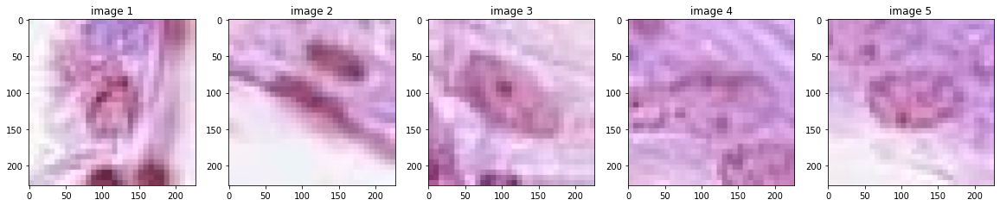

In [ ]:
plt.figure(figsize=(20,20))
for i in range(5):
    img = train_X[i] 
    ax = plt.subplot(1,5,i+1)
    ax.title.set_text("image " + str(i+1))
    plt.imshow(img)

In [ ]:
class AlexNet():
    def __init__(self):
        self.model = models.Sequential()
        self.model.add(layers.Conv2D(filters=96, kernel_size=(11,11), strides=(4,4), activation='relu', input_shape=(227,227,3)))
        self.model.add(layers.BatchNormalization())
        self.model.add(layers.MaxPool2D(pool_size=(3,3), strides=(2,2)))
        self.model.add(layers.Conv2D(filters=256, kernel_size=(5,5), strides=(1,1), activation='relu', padding="same"))
        self.model.add(layers.BatchNormalization())
        self.model.add(layers.MaxPool2D(pool_size=(3,3), strides=(2,2)))
        self.model.add(layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"))
        self.model.add(layers.BatchNormalization())
        self.model.add(layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"))
        self.model.add(layers.BatchNormalization())
        self.model.add(layers.Conv2D(filters=256, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"))
        self.model.add(layers.BatchNormalization())
        self.model.add(layers.MaxPool2D(pool_size=(3,3), strides=(2,2)))
        self.model.add(layers.Flatten())
        self.model.add(layers.Dense(4096, activation='relu'))
        self.model.add(layers.Dropout(0.5))
        self.model.add(layers.Dense(4096, activation='relu'))
        self.model.add(layers.Dropout(0.5))
        self.model.add(layers.Dense(10, activation='softmax'))
        

    def summary(self):
        self.model.summary()
    
    def get_model(self):
        return self.model

    def train_model(self, train_X, train_Y, n_epochs=50):
        self.model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

        self.history = self.model.fit(x=np.array(train_X, np.float32), y=np.array(list(map(int,train_Y)), np.float32), epochs=n_epochs)
        return self.history

    def predict(self, test_X):
        pred = self.model.predict(x=np.array(test_X, np.float32)) 
        pred = np.argmax(pred, axis = 1)
        return pred


rccnet = AlexNet()
rccnet.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_10 (Conv2D)           (None, 55, 55, 96)        34944     
_________________________________________________________________
batch_normalization_10 (Batc (None, 55, 55, 96)        384       
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 27, 27, 96)        0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 27, 27, 256)       614656    
_________________________________________________________________
batch_normalization_11 (Batc (None, 27, 27, 256)       1024      
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 13, 13, 256)       0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 13, 13, 384)      

In [ ]:
history = rccnet.train_model(train_X, train_Y, 10)

Epoch 1/10
2/2 [==============================] - 7s 2s/step - loss: 13.4899 - accuracy: 0.0455
Epoch 2/10
2/2 [==============================] - 7s 2s/step - loss: 109.3000 - accuracy: 0.2955
Epoch 3/10
2/2 [==============================] - 7s 2s/step - loss: 46.9293 - accuracy: 0.2955
Epoch 4/10
2/2 [==============================] - 6s 2s/step - loss: 26.5595 - accuracy: 0.5000
Epoch 5/10
2/2 [==============================] - 6s 2s/step - loss: 15.6666 - accuracy: 0.4545
Epoch 6/10
2/2 [==============================] - 7s 2s/step - loss: 17.1360 - accuracy: 0.5909
Epoch 7/10
2/2 [==============================] - 7s 2s/step - loss: 11.4606 - accuracy: 0.6364
Epoch 8/10
2/2 [==============================] - 7s 2s/step - loss: 9.2680 - accuracy: 0.5455
Epoch 9/10
2/2 [==============================] - 7s 2s/step - loss: 3.3689 - accuracy: 0.7500
Epoch 10/10
2/2 [==============================] - 6s 2s/step - loss: 4.5087 - accuracy: 0.7273


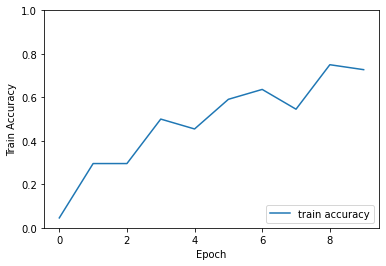

In [ ]:
plt.plot(history.history['accuracy'], label='train accuracy')
#plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Train Accuracy')
plt.ylim([0, 1])
plt.legend(loc='lower right')

#test_loss, test_acc = model.evaluate(test_X,  test_Y, verbose=2)

In [ ]:
pred = rccnet.predict(test_X) 
print(pred)
print(test_Y)
report = classification_report(test_Y, pred)
print(report)

[1 1 1 1 1 1 1 1 1 1 1 1]
[2, 2, 2, 0, 0, 0, 1, 1, 1, 3, 3, 3]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         3
           1       0.25      1.00      0.40         3
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         3

    accuracy                           0.25        12
   macro avg       0.06      0.25      0.10        12
weighted avg       0.06      0.25      0.10        12



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# Training with Data Augmentation

In [ ]:
from copy import deepcopy

aug_train_X = deepcopy(train_X)
aug_train_Y = deepcopy(train_Y)

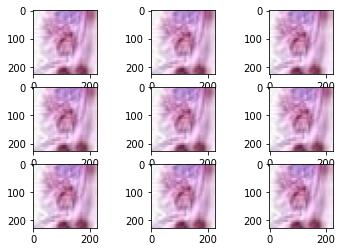

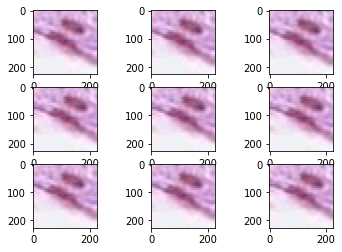

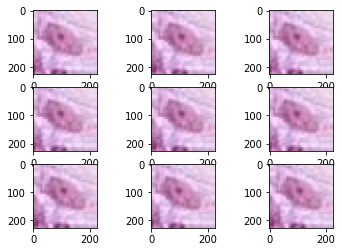

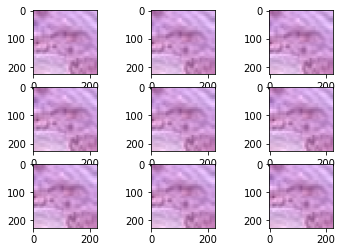

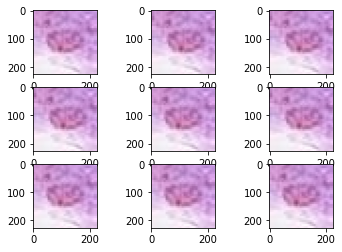

...

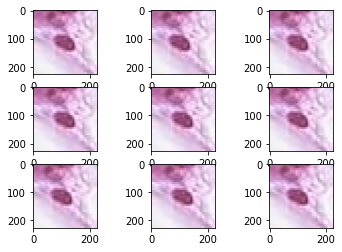

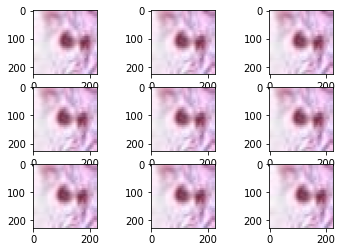

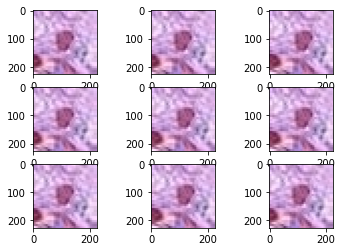

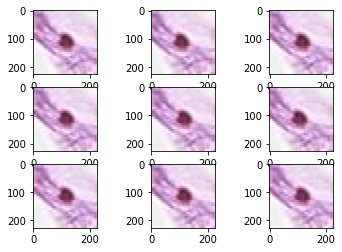

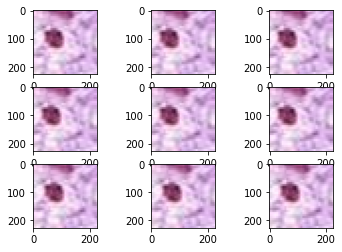

In [ ]:
for k in range(len(train_X)):
  samples = expand_dims(train_X[k], 0)
  # create image data augmentation generator
  datagen = ImageDataGenerator(width_shift_range=[-5,5])
  # prepare iterator
  it = datagen.flow(samples, batch_size=1)
  # generate samples and plot
  for i in range(9):
      # define subplot
      pyplot.subplot(330 + 1 + i)
	  # generate batch of images
      batch = it.next()
      # convert to unsigned integers for viewing
      image = batch[0].astype('float32')
      aug_train_X.append(image)
      aug_train_Y.append(train_Y[k])
	    #plot raw pixel data
      pyplot.imshow(image)
      #show the figure
  pyplot.show()

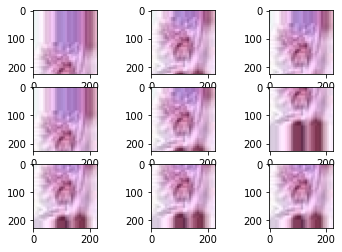

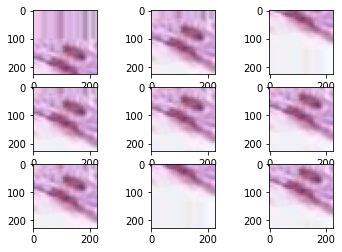

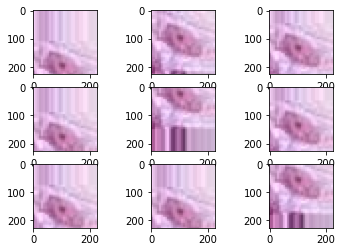

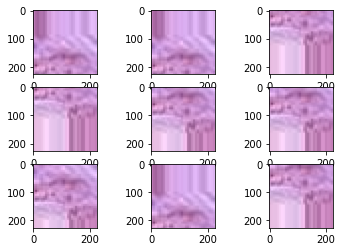

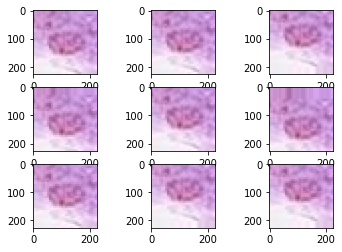

...

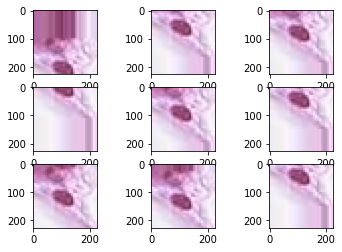

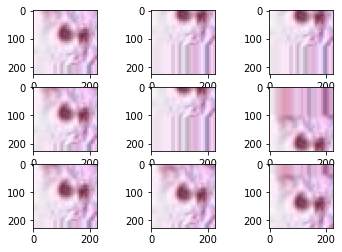

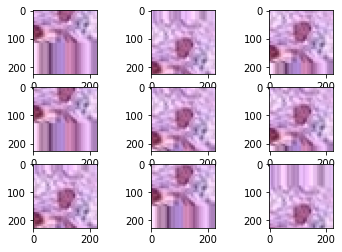

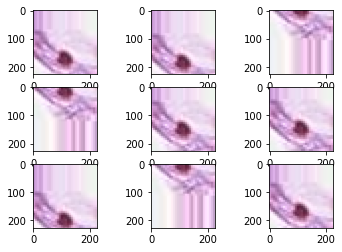

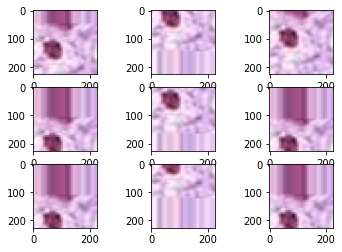

In [ ]:
for k in range(len(train_X)):
  samples = expand_dims(train_X[k], 0)
  # create image data augmentation generator
  datagen = ImageDataGenerator(height_shift_range=0.5)
  # prepare iterator
  it = datagen.flow(samples, batch_size=1)
  # generate samples and plot
  for i in range(9):
      # define subplot
      pyplot.subplot(330 + 1 + i)
	  # generate batch of images
      batch = it.next()
      # convert to unsigned integers for viewing
      image = batch[0].astype('float32')
      aug_train_X.append(image)
      aug_train_Y.append(train_Y[k])
	  # plot raw pixel data
      pyplot.imshow(image)
      #show the figure
  pyplot.show()

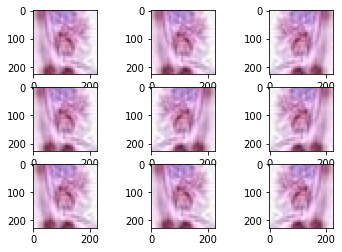

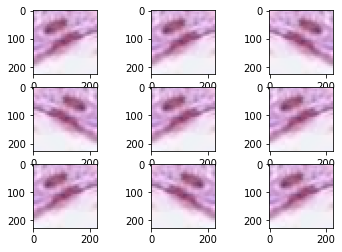

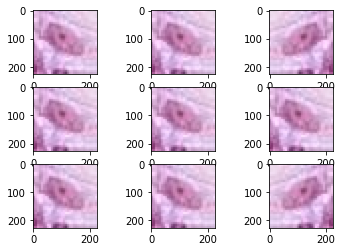

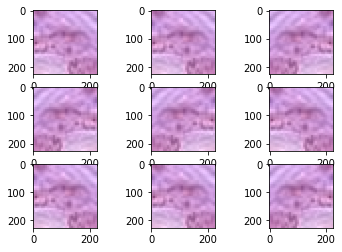

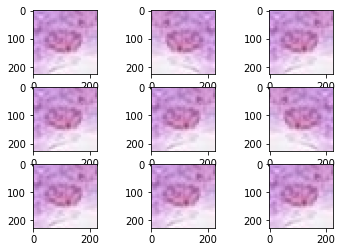

...

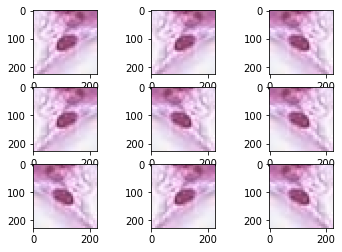

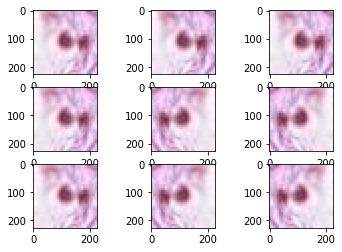

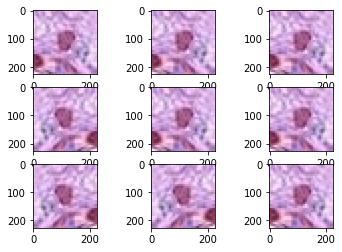

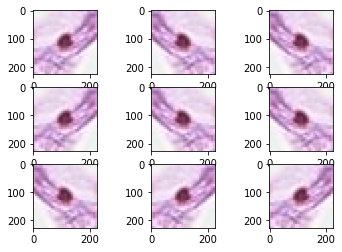

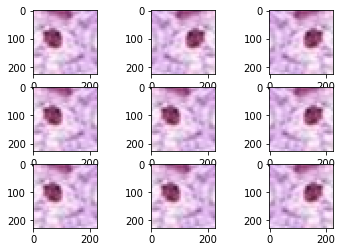

In [ ]:
for k in range(len(train_X)):
  samples = expand_dims(train_X[k], 0)
  # create image data augmentation generator
  datagen = ImageDataGenerator(horizontal_flip=True)
  # prepare iterator
  it = datagen.flow(samples, batch_size=1)
  # generate samples and plot
  for i in range(9):
      # define subplot
      pyplot.subplot(330 + 1 + i)
	  # generate batch of images
      batch = it.next()
      # convert to unsigned integers for viewing
      image = batch[0].astype('float32')
      aug_train_X.append(image)
      aug_train_Y.append(train_Y[k])
	  # plot raw pixel data
      pyplot.imshow(image)
      #show the figure
  pyplot.show()

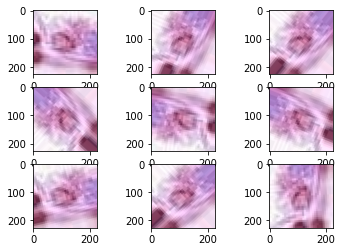

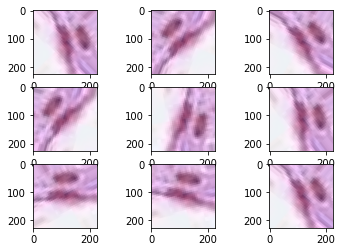

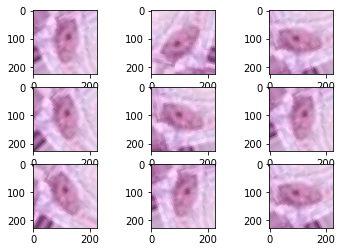

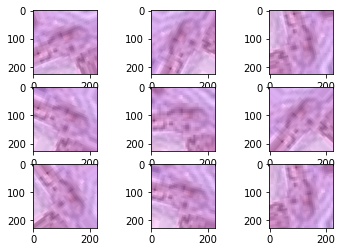

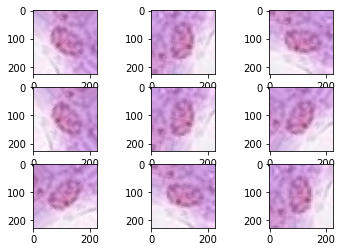

...

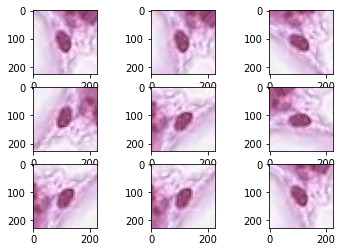

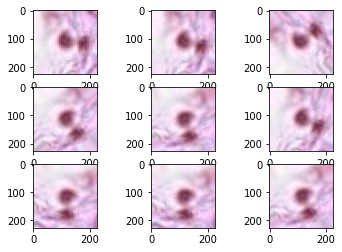

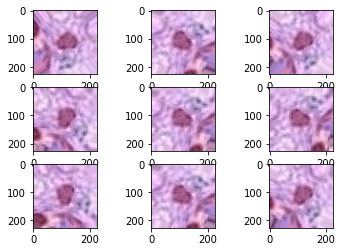

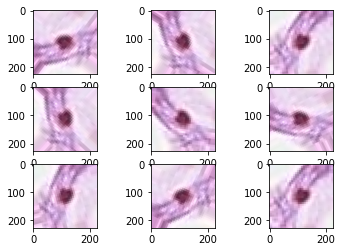

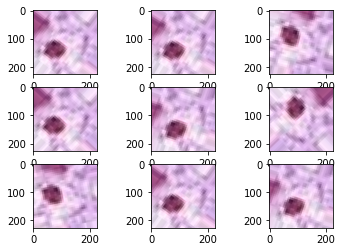

In [ ]:
for k in range(len(train_X)):
  samples = expand_dims(train_X[k], 0)
  # create image data augmentation generator
  datagen = ImageDataGenerator(rotation_range=90)
  # prepare iterator
  it = datagen.flow(samples, batch_size=1)
  # generate samples and plot
  for i in range(9):
      # define subplot
      pyplot.subplot(330 + 1 + i)
	  # generate batch of images
      batch = it.next()
      # convert to unsigned integers for viewing
      image = batch[0].astype('float32')
      aug_train_X.append(image)
      aug_train_Y.append(train_Y[k])
	  # plot raw pixel data
      pyplot.imshow(image)
      #show the figure
  pyplot.show()

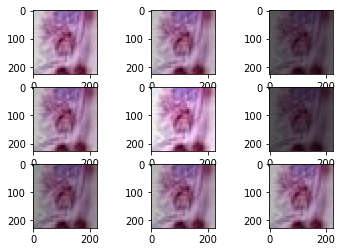

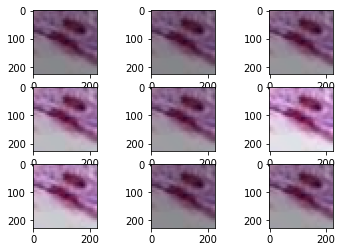

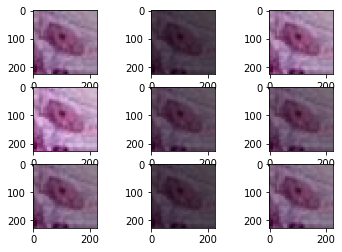

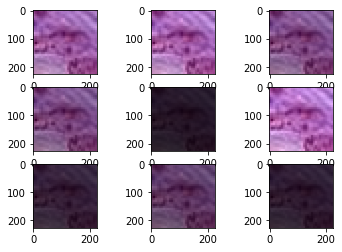

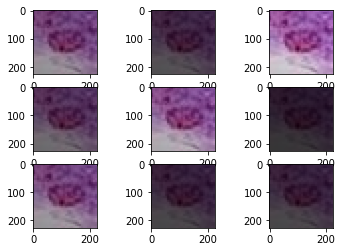

...

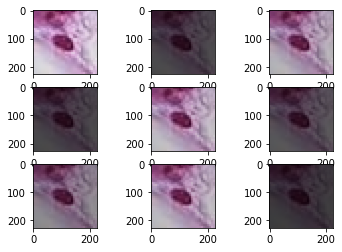

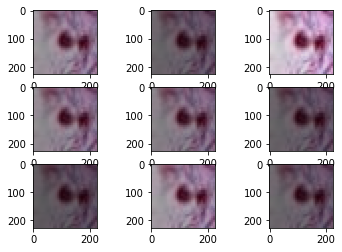

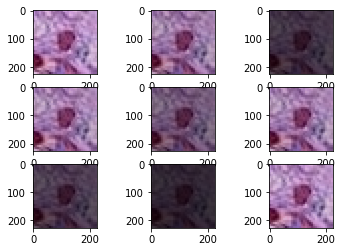

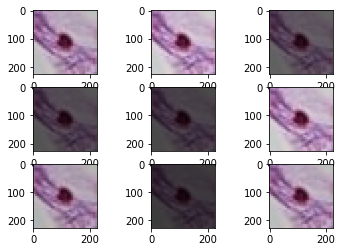

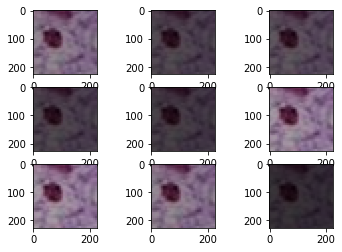

In [ ]:
for j in range(len(train_X)):
  samples = expand_dims(train_X[j], 0)
  datagen = ImageDataGenerator(brightness_range=[0.2,1.0])
  it = datagen.flow(samples, batch_size=1)
  for i in range(9):
      # define subplot
      pyplot.subplot(330 + 1 + i)
	  # generate batch of images
      batch = it.next()
      image = batch[0].astype('uint8')
      aug_train_X.append(image)
      aug_train_Y.append(train_Y[k])
      pyplot.imshow(image)
      #show the figure
  pyplot.show()

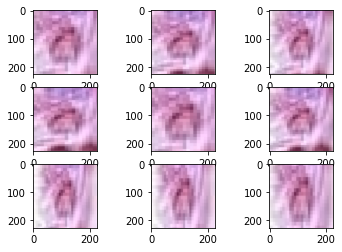

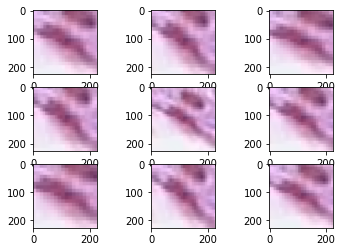

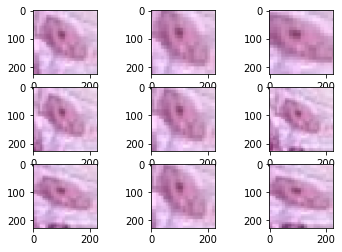

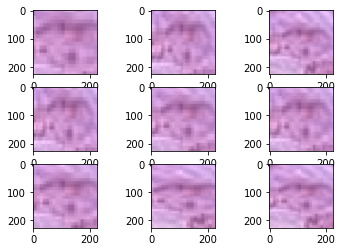

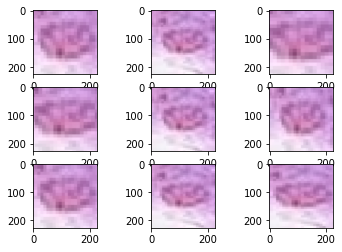

...

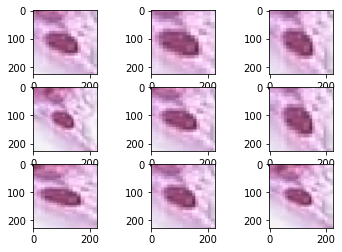

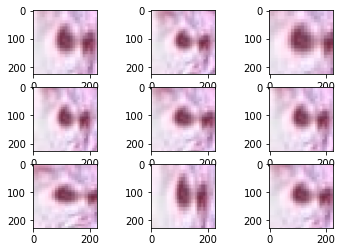

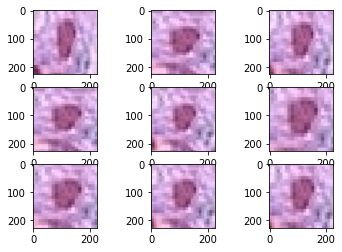

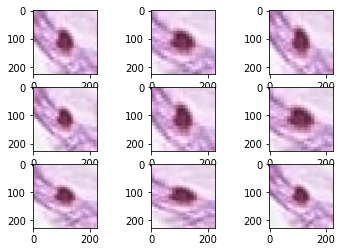

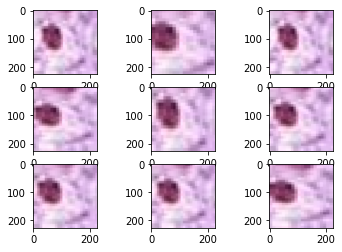

In [ ]:
for k in range(len(train_X)):
  samples = expand_dims(train_X[k], 0)
  # create image data augmentation generator
  datagen = ImageDataGenerator(zoom_range=[0.5,1.0])
  # prepare iterator
  it = datagen.flow(samples, batch_size=1)
  # generate samples and plot
  for i in range(9):
      # define subplot
      pyplot.subplot(330 + 1 + i)
	  # generate batch of images
      batch = it.next()
      # convert to unsigned integers for viewing
      image = batch[0].astype('float32')
      aug_train_X.append(image)
      aug_train_Y.append(train_Y[k])
	  # plot raw pixel data
      pyplot.imshow(image)
      #show the figure
  pyplot.show()

In [ ]:
augmented_rccnet = AlexNet()
augmented_rccnet.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_15 (Conv2D)           (None, 55, 55, 96)        34944     
_________________________________________________________________
batch_normalization_15 (Batc (None, 55, 55, 96)        384       
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 27, 27, 96)        0         
_________________________________________________________________
conv2d_16 (Conv2D)           (None, 27, 27, 256)       614656    
_________________________________________________________________
batch_normalization_16 (Batc (None, 27, 27, 256)       1024      
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 13, 13, 256)       0         
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 13, 13, 384)      

In [ ]:
history2 = augmented_rccnet.train_model(aug_train_X, aug_train_Y, 10)

Epoch 1/10
76/76 [==============================] - 368s 5s/step - loss: 6.3204 - accuracy: 0.3545
Epoch 2/10
76/76 [==============================] - 360s 5s/step - loss: 1.2418 - accuracy: 0.3777
Epoch 3/10
76/76 [==============================] - 364s 5s/step - loss: 1.2497 - accuracy: 0.3587
Epoch 4/10
76/76 [==============================] - 364s 5s/step - loss: 1.2054 - accuracy: 0.3727
Epoch 5/10
76/76 [==============================] - 361s 5s/step - loss: 1.1686 - accuracy: 0.3640
Epoch 6/10
76/76 [==============================] - 360s 5s/step - loss: 1.1718 - accuracy: 0.3562
Epoch 7/10
76/76 [==============================] - 356s 5s/step - loss: 1.1679 - accuracy: 0.3545
Epoch 8/10
76/76 [==============================] - 360s 5s/step - loss: 1.1640 - accuracy: 0.3694
Epoch 9/10
76/76 [==============================] - 359s 5s/step - loss: 1.1613 - accuracy: 0.3702
Epoch 10/10
76/76 [==============================] - 354s 5s/step - loss: 1.1669 - accuracy: 0.3736


In [ ]:
pred2 = augmented_rccnet.predict(np.array(test_X, np.float32)) 
print(pred2)
print(test_Y)
report2 = classification_report(test_Y, pred2)
print(report2)

[2 2 2 2 2 2 2 2 2 2 2 2]
[2, 2, 2, 0, 0, 0, 1, 1, 1, 3, 3, 3]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         3
           1       0.00      0.00      0.00         3
           2       0.25      1.00      0.40         3
           3       0.00      0.00      0.00         3

    accuracy                           0.25        12
   macro avg       0.06      0.25      0.10        12
weighted avg       0.06      0.25      0.10        12



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
